In [1]:
!pip install ultralytics

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.2.48 🚀 Python-3.10.12 torch-2.3.0+cu121 CPU (Intel Xeon 2.20GHz)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 30.2/107.7 GB disk)


In [2]:
from ultralytics import YOLO
import cv2

model = YOLO('yolov8n-pose.pt')

100%|██████████| 6.52M/6.52M [00:00<00:00, 79.0MB/s]



image 1/1 /content/Q3_pose.png: 448x640 12 persons, 322.7ms
Speed: 20.0ms preprocess, 322.7ms inference, 25.8ms postprocess per image at shape (1, 3, 448, 640)

 8 Persons detected.


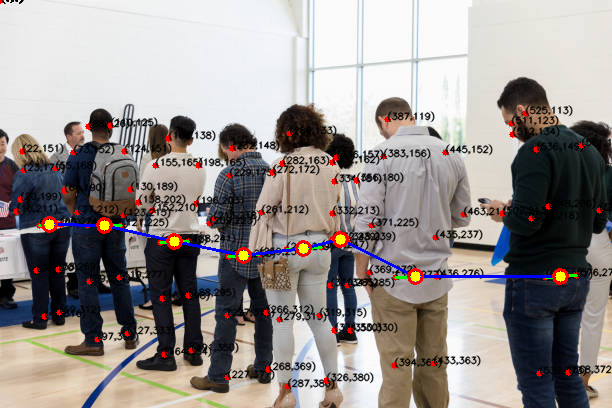

In [3]:
import cv2
from ultralytics import YOLO
from google.colab.patches import cv2_imshow
from ultralytics import YOLO
import numpy as np
import pandas as pd

def significant_pose_detection(arr, th):
  n = len(arr)
  i=0
  for itemm in arr:
    if np.sum(itemm[0]+itemm[1])!=0:
      i = i + 1

  sig_det = (i/n)
  if sig_det>=th:
    return 1

  return 0


# Load a model
model = YOLO('yolov8n-pose.pt')

image_file_name = "Q3_pose.png"
img = cv2.imread(image_file_name)
results = model.predict(image_file_name)[0]
th = 0.3

Q = []
det = 0
concat_df = pd.DataFrame()

for result in results:
  landmarks = []
  kpts = result.keypoints
  nk = kpts.shape[1]

  for i in range(nk):
    keypoint = kpts.xy[0, i]
    x, y = int(keypoint[0].item()), int(keypoint[1].item())
    landmarks.append([x,y])

  # Create a NumPy Array from list
  detections = significant_pose_detection(landmarks, th)
  if detections==1:
    det = det + 1
    for j in range(len(landmarks)):
      x = landmarks[j][0]
      y = landmarks[j][1]
      cv2.circle(img, (x, y), 3, (0, 0, 255), -1)
      ttext = "("+str(x)+","+str(y)+")"
      cv2.putText(img, ttext, (x, y), cv2.FONT_HERSHEY_SIMPLEX,
                    0.3, (0,0,0), 1, cv2.LINE_AA)

    # Calling DataFrame constructor on list
    df = pd.DataFrame(landmarks, columns =['x'+str(det), 'y'+str(det)], dtype = float)
    concat_df = pd.concat([concat_df, df], axis=1)

    cv2.line(img, landmarks[11], landmarks[12], (0,255,0), 2)
    a = (landmarks[11][0] + landmarks[12][0])//2
    b = (landmarks[11][1] + landmarks[12][1])//2
    #print(a," ",b)
    #cv2.circle(img, (a, b), 5, (0, 255, 255), -1)
    #cv2.circle(img, (a, b), 7, (0, 0, 255), 2)
    Q.append([a,b])

m = list(map(lambda l: [v for v in l if v != 0], sorted(Q)))
# Remove empty List from List
# using list comprehension
nQ = [ele for ele in m if ele != []]


dict={}
sorted_Q=sorted(Q)
for i,point in enumerate(Q):
  j=sorted_Q.index(point)
  dict[j]=i

# print(concat_df)

#k, _, _ = results.keypoints.xy.cpu().numpy().shape
k = len(nQ)  # actual detected person after discarding zeros

# draw lines between persons
i=0
while i<(k-1):
  cv2.line(img, nQ[i], nQ[i+1], (255, 0,0), 2)
  i = i + 1

# draw centroids for each person
i = 0
while i<k:
  cv2.circle(img, nQ[i], 5, (0, 255, 255), -1)
  cv2.circle(img, nQ[i], 7, (0, 0, 255), 2)
  i = i + 1

# dataframe to csv
concat_df.to_csv('detected_pose.csv')
df_nQ = pd.DataFrame(nQ, columns =['x', 'y'], dtype = int)
df_nQ.to_csv('nQ_centroids.csv')


print("\n", k, "Persons detected.")
cv2.imwrite("output.jpg", img)
cv2_imshow(img)

408 612
[[49, 224], [104, 225], [174, 241], [243, 255], [303, 248], [340, 239], [415, 276], [560, 276]]


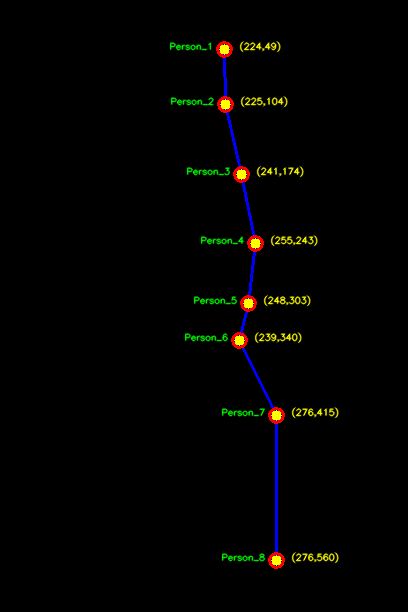

In [4]:
image_file_name = "output.jpg"
src = cv2.imread(image_file_name)
h,w,c = src.shape
print(h,w)
canva = np.zeros([h,w,3],dtype=np.uint8)  # change the h, w
print(nQ)

nQT = [[itemm[1],itemm[0]] for itemm in nQ]

# draw lines between persons
i=0
while i<(k-1):
  cv2.line(canva, nQ[i], nQ[i+1], (255, 0,0), 2)
  i = i + 1

# draw centroids for each person
i = 0
while i<k:
  cv2.circle(canva, nQ[i], 5, (0, 255, 255), -1)
  cv2.circle(canva, nQ[i], 7, (0, 0, 255), 2)
  ttext = "("+str(nQ[i][0])+","+str(nQ[i][1])+")"

  i = i + 1

canva = cv2.rotate(canva, cv2.ROTATE_90_CLOCKWISE)
## ---------------------------------------------------------------------
# Use Flip code 0 to flip vertically
image = cv2.flip(canva, 1)
i = 0
while i<k:
  ttext = "("+str(nQT[i][0])+","+str(nQT[i][1])+")"
  cv2.putText(image, ttext, (nQ[i][1]+15, nQ[i][0]), cv2.FONT_HERSHEY_SIMPLEX, 0.3, (0,255,255), 1, cv2.LINE_AA)
  cv2.putText(image, "Person_"+str(i+1), (nQT[i][0]-55, nQT[i][1]), cv2.FONT_HERSHEY_SIMPLEX,
                    0.3, (0,255,0), 1, cv2.LINE_AA)
  i = i + 1


cv2.imwrite("canvas.jpg", image)
cv2_imshow(image)

In [5]:
numPeople=len(nQ)

In [6]:
ev=[(nQ[-1][0]-nQ[0][0]),(nQ[-1][1]-nQ[0][1])]

In [7]:
ev

[511, 52]

In [8]:
forces=[]
for _ in range(numPeople):
  forces.append([0,0])

In [9]:
k=100

In [10]:
import math
def findMag(v):
  return math.sqrt(v[0]**2+v[1]**2)
def findAngle(p1,p2,ev):
  v12=[(p1[0]-p2[0]),(p1[1]-p2[1])]
  value=(v12[0]*ev[0]+v12[1]*ev[1])/(findMag(v12)*findMag(ev))
  return math.acos(value)
def findDis(p1,p2):
  return math.sqrt((p1[0]-p2[0])**2+(p1[1]-p2[1])**2)

In [11]:
for i in range(numPeople-1):
    theta=findAngle(nQ[i+1],nQ[i],ev)
    dis=findDis(nQ[i+1],nQ[i])
    deltaDis=dis*(1-math.cos(theta))
    forces[i][0]+=(k*deltaDis*math.cos(theta))
    if(nQ[i+1][1]>nQ[i][1]):
      forces[i][1]+=(k*deltaDis*math.sin(theta))
    else:
      forces[i][1]+=(-k*deltaDis*math.sin(theta))
    forces[i+1][0]+=(-1*forces[i][0])
    forces[i+1][1]+=(-1*forces[i][1])
    print(forces)

[[18.977191896809813, 1.583173767290764], [-18.977191896809813, -1.583173767290764], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0]]
[[18.977191896809813, 1.583173767290764], [35.12137203684142, 5.1211343580313775], [-35.12137203684142, -5.1211343580313775], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0]]
[[18.977191896809813, 1.583173767290764], [35.12137203684142, 5.1211343580313775], [-0.974959297692898, -1.7375206134068155], [0.974959297692898, 1.7375206134068155], [0, 0], [0, 0], [0, 0], [0, 0]]
[[18.977191896809813, 1.583173767290764], [35.12137203684142, 5.1211343580313775], [-0.974959297692898, -1.7375206134068155], [140.00768219652255, -28.99598035218141], [-140.00768219652255, 28.99598035218141], [0, 0], [0, 0], [0, 0]]
[[18.977191896809813, 1.583173767290764], [35.12137203684142, 5.1211343580313775], [-0.974959297692898, -1.7375206134068155], [140.00768219652255, -28.99598035218141], [65.52166363858981, -43.71229682567194], [-65.52166363858981, 43.71229682567194], [0, 0], [0, 0]]
[[

In [12]:
# for i in range(numPeople-1):
#     theta=findAngle(nQ[i+1],nQ[i],ev)
#     dis=findDis(nQ[i+1],nQ[i])
#     deltaDis=dis*(1-math.cos(theta))
#     frcx=(k*deltaDis*math.cos(theta))
#     if(nQ[i+1][1]>nQ[i][1]):
#       frcy=(k*deltaDis*math.sin(theta))
#     else:
#       frcy=(-k*deltaDis*math.sin(theta))
#     forces[i][0]+=frcx
#     forces[i][1]+=frcy
#     forces[i+1][0]+=(-1*frcx)
#     forces[i+1][1]+=(-1*frcy)
#     print(forces)

In [13]:
print(forces)

[[18.977191896809813, 1.583173767290764], [35.12137203684142, 5.1211343580313775], [-0.974959297692898, -1.7375206134068155], [140.00768219652255, -28.99598035218141], [65.52166363858981, -43.71229682567194], [428.2387255482644, 227.81282505064956], [-354.1232721068133, -235.3549064184685], [354.1232721068133, 235.3549064184685]]


In [14]:
equivalent=[]
for force in forces:
  equivalent.append(math.sqrt(force[0]**2+force[1]**2))

In [15]:
print(equivalent)

[19.043115592407187, 35.492770966257844, 1.9923663102380107, 142.97873251161008, 78.76454341735342, 485.0640053815162, 425.20021616043687, 425.20021616043687]


In [16]:
import cv2
import numpy as np

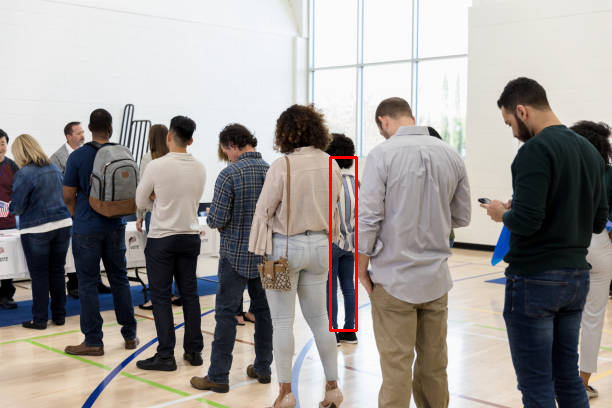

In [17]:
def mark_outliers(nQ, tnet, threshold):
    img = cv2.imread('Q3_pose.png')

    nQ = np.array(nQ, dtype=int)

    for i in range(len(nQ)):
        if tnet[i] > threshold:
            person_no = dict[i] + 1

            x = concat_df['x' + str(person_no)]
            y = concat_df['y' + str(person_no)]

            x_non_zero = [value for value in x if value != 0]
            y_non_zero = [value for value in y if value != 0]

            min_x = int(min(x_non_zero)) if x_non_zero else 0
            min_y = int(min(y_non_zero)) if y_non_zero else 0
            max_x = int(max(x_non_zero)) if x_non_zero else 0
            max_y = int(max(y_non_zero)) if y_non_zero else 0

            start_point = (min_x, min_y)
            end_point = (max_x, max_y)
            color = (0, 0, 255)
            thickness = 2
            img = cv2.rectangle(img, start_point, end_point, color, thickness)

    cv2.imwrite('output_outlier.png', img)
    cv2_imshow(img)

threshold=425.20021616043687
mark_outliers(nQ, equivalent, threshold)


image 1/1 /content/Q3_pose.png: 448x640 12 persons, 219.1ms
Speed: 4.8ms preprocess, 219.1ms inference, 1.3ms postprocess per image at shape (1, 3, 448, 640)

 8 Persons detected.


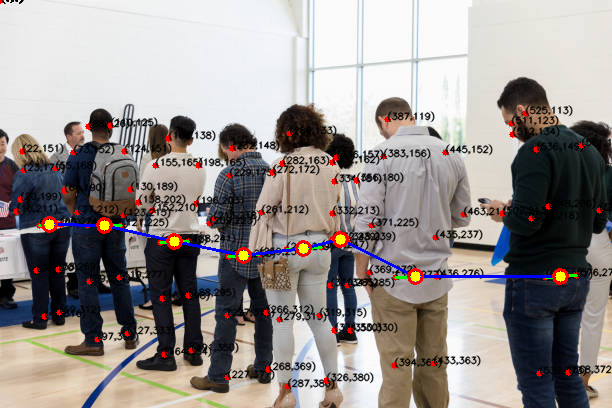

[[18.977191896809813, 1.583173767290764], [-18.977191896809813, -1.583173767290764], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0]]
[[18.977191896809813, 1.583173767290764], [35.12137203684142, 5.1211343580313775], [-35.12137203684142, -5.1211343580313775], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0]]
[[18.977191896809813, 1.583173767290764], [35.12137203684142, 5.1211343580313775], [-0.974959297692898, -1.7375206134068155], [0.974959297692898, 1.7375206134068155], [0, 0], [0, 0], [0, 0], [0, 0]]
[[18.977191896809813, 1.583173767290764], [35.12137203684142, 5.1211343580313775], [-0.974959297692898, -1.7375206134068155], [140.00768219652255, -28.99598035218141], [-140.00768219652255, 28.99598035218141], [0, 0], [0, 0], [0, 0]]
[[18.977191896809813, 1.583173767290764], [35.12137203684142, 5.1211343580313775], [-0.974959297692898, -1.7375206134068155], [140.00768219652255, -28.99598035218141], [65.52166363858981, -43.71229682567194], [-65.52166363858981, 43.71229682567194], [0, 0], [0, 0]]
[[

<ipython-input-22-9a3acf8df7d4>:135: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = cm.get_cmap('jet')


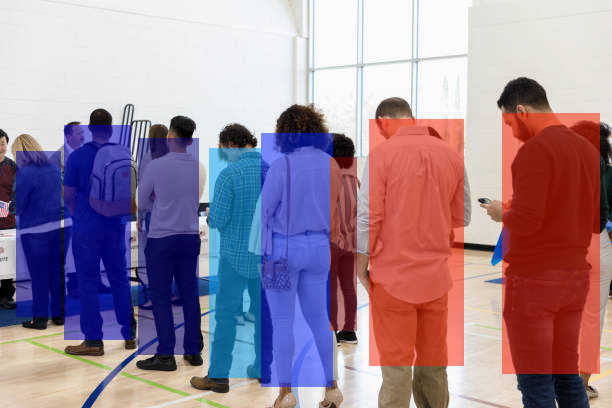

In [22]:
import cv2
from ultralytics import YOLO
import numpy as np
import pandas as pd
import math
import matplotlib.pyplot as plt
import matplotlib.cm as cm

def significant_pose_detection(arr, th):
    n = len(arr)
    i = 0
    for itemm in arr:
        if np.sum(itemm[0] + itemm[1]) != 0:
            i += 1

    sig_det = (i / n)
    if sig_det >= th:
        return 1

    return 0

# Load a model
model = YOLO('yolov8n-pose.pt')

image_file_name = "Q3_pose.png"
img = cv2.imread(image_file_name)
results = model.predict(image_file_name)[0]
th = 0.3

Q = []
det = 0
concat_df = pd.DataFrame()

for result in results:
    landmarks = []
    kpts = result.keypoints
    nk = kpts.shape[1]

    for i in range(nk):
        keypoint = kpts.xy[0, i]
        x, y = int(keypoint[0].item()), int(keypoint[1].item())
        landmarks.append([x, y])

    detections = significant_pose_detection(landmarks, th)
    if detections == 1:
        det += 1
        for j in range(len(landmarks)):
            x = landmarks[j][0]
            y = landmarks[j][1]
            cv2.circle(img, (x, y), 3, (0, 0, 255), -1)
            ttext = "(" + str(x) + "," + str(y) + ")"
            cv2.putText(img, ttext, (x, y), cv2.FONT_HERSHEY_SIMPLEX, 0.3, (0, 0, 0), 1, cv2.LINE_AA)

        df = pd.DataFrame(landmarks, columns=['x' + str(det), 'y' + str(det)], dtype=float)
        concat_df = pd.concat([concat_df, df], axis=1)

        cv2.line(img, landmarks[11], landmarks[12], (0, 255, 0), 2)
        a = (landmarks[11][0] + landmarks[12][0]) // 2
        b = (landmarks[11][1] + landmarks[12][1]) // 2
        Q.append([a, b])

m = list(map(lambda l: [v for v in l if v != 0], sorted(Q)))
nQ = [ele for ele in m if ele != []]

dict = {}
sorted_Q = sorted(Q)
for i, point in enumerate(Q):
    j = sorted_Q.index(point)
    dict[j] = i

k = len(nQ)

i = 0
while i < (k - 1):
    cv2.line(img, nQ[i], nQ[i + 1], (255, 0, 0), 2)
    i += 1

i = 0
while i < k:
    cv2.circle(img, nQ[i], 5, (0, 255, 255), -1)
    cv2.circle(img, nQ[i], 7, (0, 0, 255), 2)
    i += 1

concat_df.to_csv('detected_pose.csv')
df_nQ = pd.DataFrame(nQ, columns=['x', 'y'], dtype=int)
df_nQ.to_csv('nQ_centroids.csv')

print("\n", k, "Persons detected.")
cv2.imwrite("output.jpg", img)
cv2_imshow(img)

numPeople = len(nQ)
ev = [(nQ[-1][0] - nQ[0][0]), (nQ[-1][1] - nQ[0][1])]
forces = [[0, 0] for _ in range(numPeople)]
k = 100

def findMag(v):
    return math.sqrt(v[0]**2 + v[1]**2)

def findAngle(p1, p2, ev):
    v12 = [(p1[0] - p2[0]), (p1[1] - p2[1])]
    value = (v12[0] * ev[0] + v12[1] * ev[1]) / (findMag(v12) * findMag(ev))
    return math.acos(value)

def findDis(p1, p2):
    return math.sqrt((p1[0] - p2[0])**2 + (p1[1] - p2[1])**2)

for i in range(numPeople - 1):
    theta = findAngle(nQ[i + 1], nQ[i], ev)
    dis = findDis(nQ[i + 1], nQ[i])
    deltaDis = dis * (1 - math.cos(theta))
    forces[i][0] += (k * deltaDis * math.cos(theta))
    if nQ[i + 1][1] > nQ[i][1]:
        forces[i][1] += (k * deltaDis * math.sin(theta))
    else:
        forces[i][1] += (-k * deltaDis * math.sin(theta))
    forces[i + 1][0] += (-1 * forces[i][0])
    forces[i + 1][1] += (-1 * forces[i][1])
    print(forces)

equivalent = [math.sqrt(force[0]**2 + force[1]**2) for force in forces]
print(equivalent)

def mark_outliers(nQ, tnet):
    img = cv2.imread('Q3_pose.png')
    overlay = img.copy()
    output = img.copy()

    nQ = np.array(nQ, dtype=int)

    max_force = max(tnet)
    min_force = min(tnet)
    norm_tnet = [(value - min_force) / (max_force - min_force) for value in tnet]

    colormap = cm.get_cmap('jet')
    colors = colormap(norm_tnet)

    alpha = 0.5  # Transparency factor

    for i in range(len(nQ)):
        person_no = dict[i] + 1
        x = concat_df['x' + str(person_no)]
        y = concat_df['y' + str(person_no)]

        x_non_zero = [value for value in x if value != 0]
        y_non_zero = [value for value in y if value != 0]

        min_x = int(min(x_non_zero)) if x_non_zero else 0
        min_y = int(min(y_non_zero)) if y_non_zero else 0
        max_x = int(max(x_non_zero)) if x_non_zero else 0
        max_y = int(max(y_non_zero)) if y_non_zero else 0

        start_point = (min_x, min_y)
        end_point = (max_x, max_y)
        color = (colors[i][2] * 255, colors[i][1] * 255, colors[i][0] * 255)
        color = tuple(map(int, color))

        cv2.rectangle(overlay, start_point, end_point, color, -1)

    # Blend the overlay with the original image
    cv2.addWeighted(overlay, alpha, output, 1 - alpha, 0, output)

    cv2.imwrite('output_outlier.png', output)
    cv2_imshow(output)

mark_outliers(nQ, equivalent)



image 1/1 /content/Q3_pose3.jpg: 448x640 10 persons, 237.8ms
Speed: 7.2ms preprocess, 237.8ms inference, 2.9ms postprocess per image at shape (1, 3, 448, 640)

 9 Persons detected.


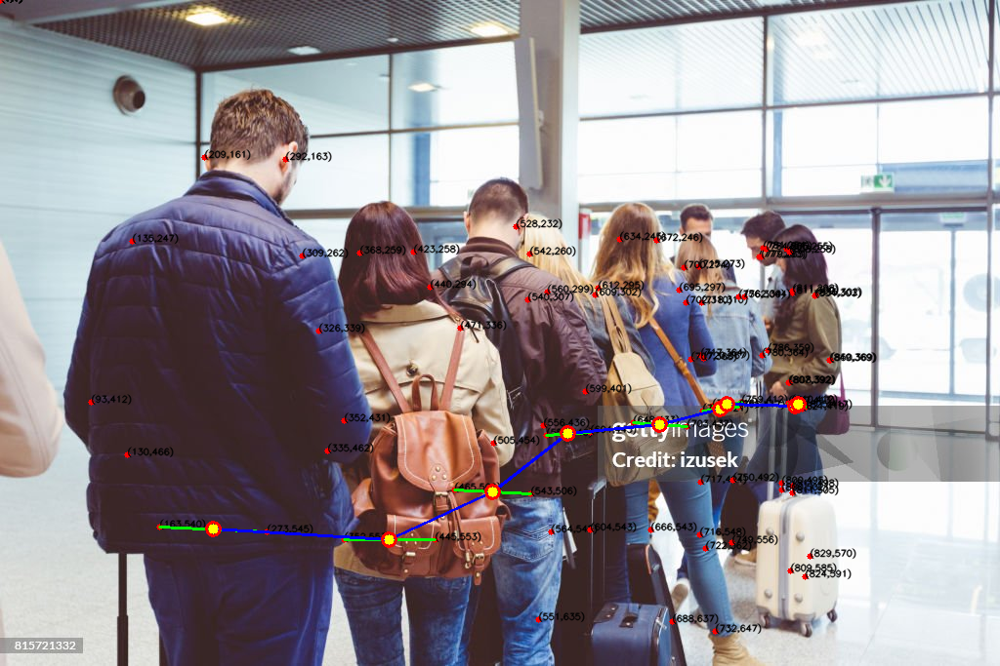

[[636.6399385260318, 177.26388695436464], [-636.6399385260318, -177.26388695436464], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0]]
[[636.6399385260318, 177.26388695436464], [-355.90836772124663, -240.77313762104944], [355.90836772124663, 240.77313762104944], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0]]
[[636.6399385260318, 177.26388695436464], [-355.90836772124663, -240.77313762104944], [1235.7910770383392, -185.79899757265792], [-1235.7910770383392, 185.79899757265792], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0]]
[[636.6399385260318, 177.26388695436464], [-355.90836772124663, -240.77313762104944], [1235.7910770383392, -185.79899757265792], [-1173.7557724694548, 178.6289523632535], [1173.7557724694548, -178.6289523632535], [0, 0], [0, 0], [0, 0], [0, 0]]
[[636.6399385260318, 177.26388695436464], [-355.90836772124663, -240.77313762104944], [1235.7910770383392, -185.79899757265792], [-1173.7557724694548, 178.6289523632535], [1179.4058592421, -178.86657148746414], [-1179.40585924

<ipython-input-25-5658f44c725a>:135: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = cm.get_cmap('jet')


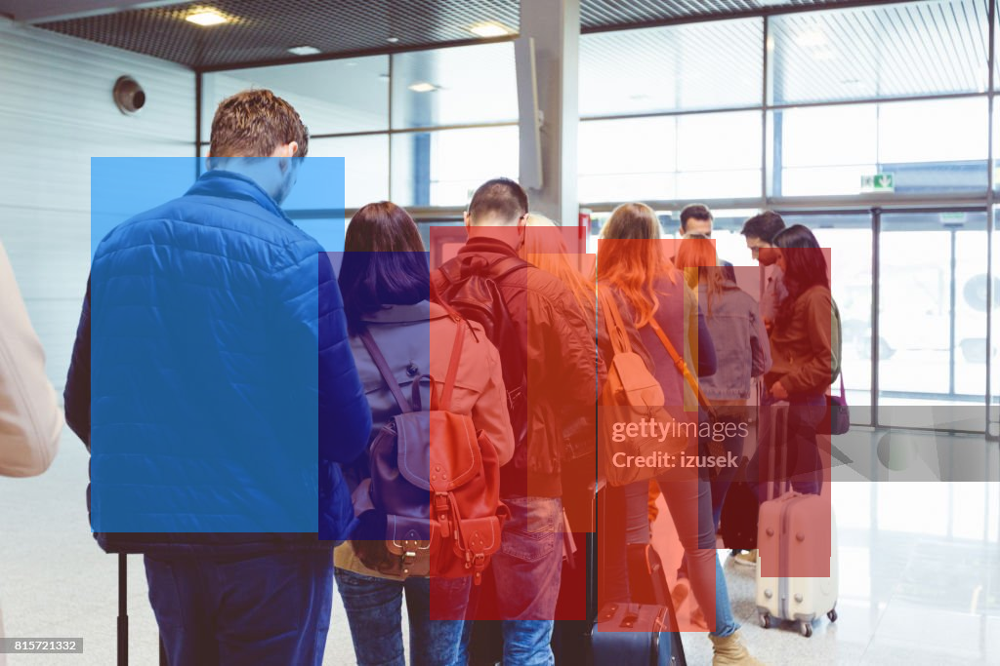

In [25]:
import cv2
from ultralytics import YOLO
import numpy as np
import pandas as pd
import math
import matplotlib.pyplot as plt
import matplotlib.cm as cm

def significant_pose_detection(arr, th):
    n = len(arr)
    i = 0
    for itemm in arr:
        if np.sum(itemm[0] + itemm[1]) != 0:
            i += 1

    sig_det = (i / n)
    if sig_det >= th:
        return 1

    return 0

# Load a model
model = YOLO('yolov8n-pose.pt')

image_file_name = "Q3_pose3.jpg"
img = cv2.imread(image_file_name)
results = model.predict(image_file_name)[0]
th = 0.3

Q = []
det = 0
concat_df = pd.DataFrame()

for result in results:
    landmarks = []
    kpts = result.keypoints
    nk = kpts.shape[1]

    for i in range(nk):
        keypoint = kpts.xy[0, i]
        x, y = int(keypoint[0].item()), int(keypoint[1].item())
        landmarks.append([x, y])

    detections = significant_pose_detection(landmarks, th)
    if detections == 1:
        det += 1
        for j in range(len(landmarks)):
            x = landmarks[j][0]
            y = landmarks[j][1]
            cv2.circle(img, (x, y), 3, (0, 0, 255), -1)
            ttext = "(" + str(x) + "," + str(y) + ")"
            cv2.putText(img, ttext, (x, y), cv2.FONT_HERSHEY_SIMPLEX, 0.3, (0, 0, 0), 1, cv2.LINE_AA)

        df = pd.DataFrame(landmarks, columns=['x' + str(det), 'y' + str(det)], dtype=float)
        concat_df = pd.concat([concat_df, df], axis=1)

        cv2.line(img, landmarks[11], landmarks[12], (0, 255, 0), 2)
        a = (landmarks[11][0] + landmarks[12][0]) // 2
        b = (landmarks[11][1] + landmarks[12][1]) // 2
        Q.append([a, b])

m = list(map(lambda l: [v for v in l if v != 0], sorted(Q)))
nQ = [ele for ele in m if ele != []]

dict = {}
sorted_Q = sorted(Q)
for i, point in enumerate(Q):
    j = sorted_Q.index(point)
    dict[j] = i

k = len(nQ)

i = 0
while i < (k - 1):
    cv2.line(img, nQ[i], nQ[i + 1], (255, 0, 0), 2)
    i += 1

i = 0
while i < k:
    cv2.circle(img, nQ[i], 5, (0, 255, 255), -1)
    cv2.circle(img, nQ[i], 7, (0, 0, 255), 2)
    i += 1

concat_df.to_csv('detected_pose.csv')
df_nQ = pd.DataFrame(nQ, columns=['x', 'y'], dtype=int)
df_nQ.to_csv('nQ_centroids.csv')

print("\n", k, "Persons detected.")
cv2.imwrite("output.jpg", img)
cv2_imshow(img)

numPeople = len(nQ)
ev = [(nQ[-1][0] - nQ[0][0]), (nQ[-1][1] - nQ[0][1])]
forces = [[0, 0] for _ in range(numPeople)]
k = 100

def findMag(v):
    return math.sqrt(v[0]**2 + v[1]**2)

def findAngle(p1, p2, ev):
    v12 = [(p1[0] - p2[0]), (p1[1] - p2[1])]
    value = (v12[0] * ev[0] + v12[1] * ev[1]) / (findMag(v12) * findMag(ev))
    return math.acos(value)

def findDis(p1, p2):
    return math.sqrt((p1[0] - p2[0])**2 + (p1[1] - p2[1])**2)

for i in range(numPeople - 1):
    theta = findAngle(nQ[i + 1], nQ[i], ev)
    dis = findDis(nQ[i + 1], nQ[i])
    deltaDis = dis * (1 - math.cos(theta))
    forces[i][0] += (k * deltaDis * math.cos(theta))
    if nQ[i + 1][1] > nQ[i][1]:
        forces[i][1] += (k * deltaDis * math.sin(theta))
    else:
        forces[i][1] += (-k * deltaDis * math.sin(theta))
    forces[i + 1][0] += (-1 * forces[i][0])
    forces[i + 1][1] += (-1 * forces[i][1])
    print(forces)

equivalent = [math.sqrt(force[0]**2 + force[1]**2) for force in forces]
print(equivalent)

def mark_outliers(nQ, tnet):
    img = cv2.imread('Q3_pose3.jpg')
    overlay = img.copy()
    output = img.copy()

    nQ = np.array(nQ, dtype=int)

    max_force = max(tnet)
    min_force = min(tnet)
    norm_tnet = [(value - min_force) / (max_force - min_force) for value in tnet]

    colormap = cm.get_cmap('jet')
    colors = colormap(norm_tnet)

    alpha = 0.5  # Transparency factor

    for i in range(len(nQ)):
        person_no = dict[i] + 1
        x = concat_df['x' + str(person_no)]
        y = concat_df['y' + str(person_no)]

        x_non_zero = [value for value in x if value != 0]
        y_non_zero = [value for value in y if value != 0]

        min_x = int(min(x_non_zero)) if x_non_zero else 0
        min_y = int(min(y_non_zero)) if y_non_zero else 0
        max_x = int(max(x_non_zero)) if x_non_zero else 0
        max_y = int(max(y_non_zero)) if y_non_zero else 0

        start_point = (min_x, min_y)
        end_point = (max_x, max_y)
        color = (colors[i][2] * 255, colors[i][1] * 255, colors[i][0] * 255)
        color = tuple(map(int, color))

        cv2.rectangle(overlay, start_point, end_point, color, -1)

    # Blend the overlay with the original image
    cv2.addWeighted(overlay, alpha, output, 1 - alpha, 0, output)

    cv2.imwrite('output_outlier.png', output)
    cv2_imshow(output)

mark_outliers(nQ, equivalent)



image 1/1 /content/Q3_pose5.jpg: 448x640 8 persons, 208.4ms
Speed: 4.8ms preprocess, 208.4ms inference, 1.2ms postprocess per image at shape (1, 3, 448, 640)

 7 Persons detected.


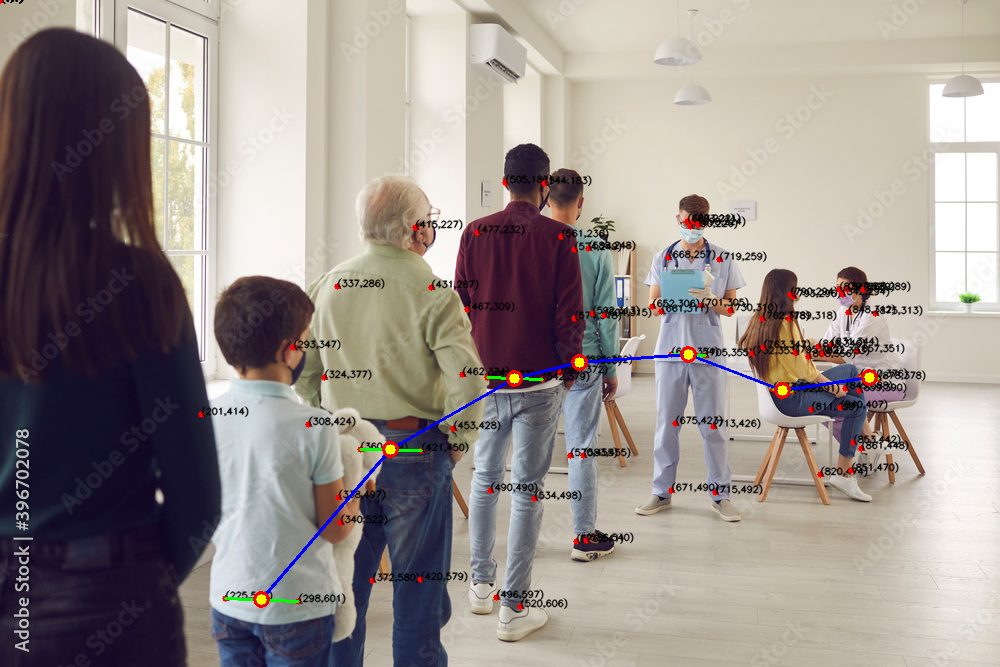

[[2200.3784585163808, -1232.0559653608802], [-2200.3784585163808, 1232.0559653608802], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0]]
[[2200.3784585163808, -1232.0559653608802], [-1997.5514225155896, 1197.2553549318], [1997.5514225155896, -1197.2553549318], [0, 0], [0, 0], [0, 0], [0, 0]]
[[2200.3784585163808, -1232.0559653608802], [-1997.5514225155896, 1197.2553549318], [2036.852052170249, -1201.5456493373583], [-2036.852052170249, 1201.5456493373583], [0, 0], [0, 0], [0, 0]]
[[2200.3784585163808, -1232.0559653608802], [-1997.5514225155896, 1197.2553549318], [2036.852052170249, -1201.5456493373583], [-1636.5852621472739, 1087.820659355225], [1636.5852621472739, -1087.820659355225], [0, 0], [0, 0]]
[[2200.3784585163808, -1232.0559653608802], [-1997.5514225155896, 1197.2553549318], [2036.852052170249, -1201.5456493373583], [-1636.5852621472739, 1087.820659355225], [3500.84548433102, 533.585159596937], [-3500.84548433102, -533.585159596937], [0, 0]]
[[2200.3784585163808, -1232.0559653608802], [

<ipython-input-26-400be2596305>:135: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = cm.get_cmap('jet')


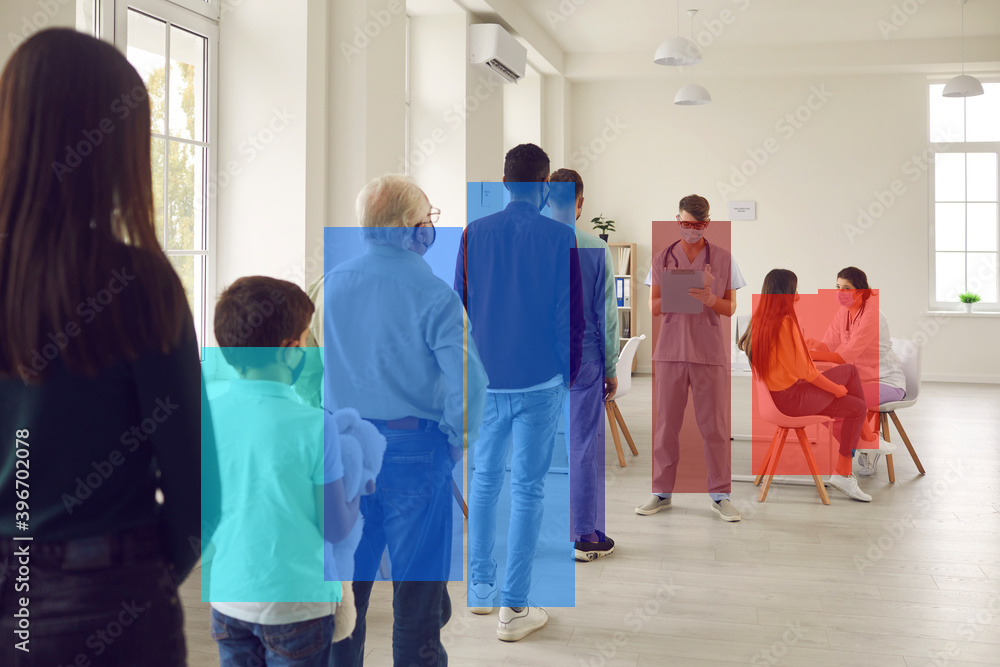

In [26]:
import cv2
from ultralytics import YOLO
import numpy as np
import pandas as pd
import math
import matplotlib.pyplot as plt
import matplotlib.cm as cm

def significant_pose_detection(arr, th):
    n = len(arr)
    i = 0
    for itemm in arr:
        if np.sum(itemm[0] + itemm[1]) != 0:
            i += 1

    sig_det = (i / n)
    if sig_det >= th:
        return 1

    return 0

# Load a model
model = YOLO('yolov8n-pose.pt')

image_file_name = "Q3_pose5.jpg"
img = cv2.imread(image_file_name)
results = model.predict(image_file_name)[0]
th = 0.3

Q = []
det = 0
concat_df = pd.DataFrame()

for result in results:
    landmarks = []
    kpts = result.keypoints
    nk = kpts.shape[1]

    for i in range(nk):
        keypoint = kpts.xy[0, i]
        x, y = int(keypoint[0].item()), int(keypoint[1].item())
        landmarks.append([x, y])

    detections = significant_pose_detection(landmarks, th)
    if detections == 1:
        det += 1
        for j in range(len(landmarks)):
            x = landmarks[j][0]
            y = landmarks[j][1]
            cv2.circle(img, (x, y), 3, (0, 0, 255), -1)
            ttext = "(" + str(x) + "," + str(y) + ")"
            cv2.putText(img, ttext, (x, y), cv2.FONT_HERSHEY_SIMPLEX, 0.3, (0, 0, 0), 1, cv2.LINE_AA)

        df = pd.DataFrame(landmarks, columns=['x' + str(det), 'y' + str(det)], dtype=float)
        concat_df = pd.concat([concat_df, df], axis=1)

        cv2.line(img, landmarks[11], landmarks[12], (0, 255, 0), 2)
        a = (landmarks[11][0] + landmarks[12][0]) // 2
        b = (landmarks[11][1] + landmarks[12][1]) // 2
        Q.append([a, b])

m = list(map(lambda l: [v for v in l if v != 0], sorted(Q)))
nQ = [ele for ele in m if ele != []]

dict = {}
sorted_Q = sorted(Q)
for i, point in enumerate(Q):
    j = sorted_Q.index(point)
    dict[j] = i

k = len(nQ)

i = 0
while i < (k - 1):
    cv2.line(img, nQ[i], nQ[i + 1], (255, 0, 0), 2)
    i += 1

i = 0
while i < k:
    cv2.circle(img, nQ[i], 5, (0, 255, 255), -1)
    cv2.circle(img, nQ[i], 7, (0, 0, 255), 2)
    i += 1

concat_df.to_csv('detected_pose.csv')
df_nQ = pd.DataFrame(nQ, columns=['x', 'y'], dtype=int)
df_nQ.to_csv('nQ_centroids.csv')

print("\n", k, "Persons detected.")
cv2.imwrite("output.jpg", img)
cv2_imshow(img)

numPeople = len(nQ)
ev = [(nQ[-1][0] - nQ[0][0]), (nQ[-1][1] - nQ[0][1])]
forces = [[0, 0] for _ in range(numPeople)]
k = 100

def findMag(v):
    return math.sqrt(v[0]**2 + v[1]**2)

def findAngle(p1, p2, ev):
    v12 = [(p1[0] - p2[0]), (p1[1] - p2[1])]
    value = (v12[0] * ev[0] + v12[1] * ev[1]) / (findMag(v12) * findMag(ev))
    return math.acos(value)

def findDis(p1, p2):
    return math.sqrt((p1[0] - p2[0])**2 + (p1[1] - p2[1])**2)

for i in range(numPeople - 1):
    theta = findAngle(nQ[i + 1], nQ[i], ev)
    dis = findDis(nQ[i + 1], nQ[i])
    deltaDis = dis * (1 - math.cos(theta))
    forces[i][0] += (k * deltaDis * math.cos(theta))
    if nQ[i + 1][1] > nQ[i][1]:
        forces[i][1] += (k * deltaDis * math.sin(theta))
    else:
        forces[i][1] += (-k * deltaDis * math.sin(theta))
    forces[i + 1][0] += (-1 * forces[i][0])
    forces[i + 1][1] += (-1 * forces[i][1])
    print(forces)

equivalent = [math.sqrt(force[0]**2 + force[1]**2) for force in forces]
print(equivalent)

def mark_outliers(nQ, tnet):
    img = cv2.imread('Q3_pose5.jpg')
    overlay = img.copy()
    output = img.copy()

    nQ = np.array(nQ, dtype=int)

    max_force = max(tnet)
    min_force = min(tnet)
    norm_tnet = [(value - min_force) / (max_force - min_force) for value in tnet]

    colormap = cm.get_cmap('jet')
    colors = colormap(norm_tnet)

    alpha = 0.5  # Transparency factor

    for i in range(len(nQ)):
        person_no = dict[i] + 1
        x = concat_df['x' + str(person_no)]
        y = concat_df['y' + str(person_no)]

        x_non_zero = [value for value in x if value != 0]
        y_non_zero = [value for value in y if value != 0]

        min_x = int(min(x_non_zero)) if x_non_zero else 0
        min_y = int(min(y_non_zero)) if y_non_zero else 0
        max_x = int(max(x_non_zero)) if x_non_zero else 0
        max_y = int(max(y_non_zero)) if y_non_zero else 0

        start_point = (min_x, min_y)
        end_point = (max_x, max_y)
        color = (colors[i][2] * 255, colors[i][1] * 255, colors[i][0] * 255)
        color = tuple(map(int, color))

        cv2.rectangle(overlay, start_point, end_point, color, -1)

    # Blend the overlay with the original image
    cv2.addWeighted(overlay, alpha, output, 1 - alpha, 0, output)

    cv2.imwrite('output_outlier.png', output)
    cv2_imshow(output)

mark_outliers(nQ, equivalent)



image 1/1 /content/Q3_pose6.jpg: 544x640 8 persons, 310.5ms
Speed: 4.0ms preprocess, 310.5ms inference, 1.9ms postprocess per image at shape (1, 3, 544, 640)

 7 Persons detected.


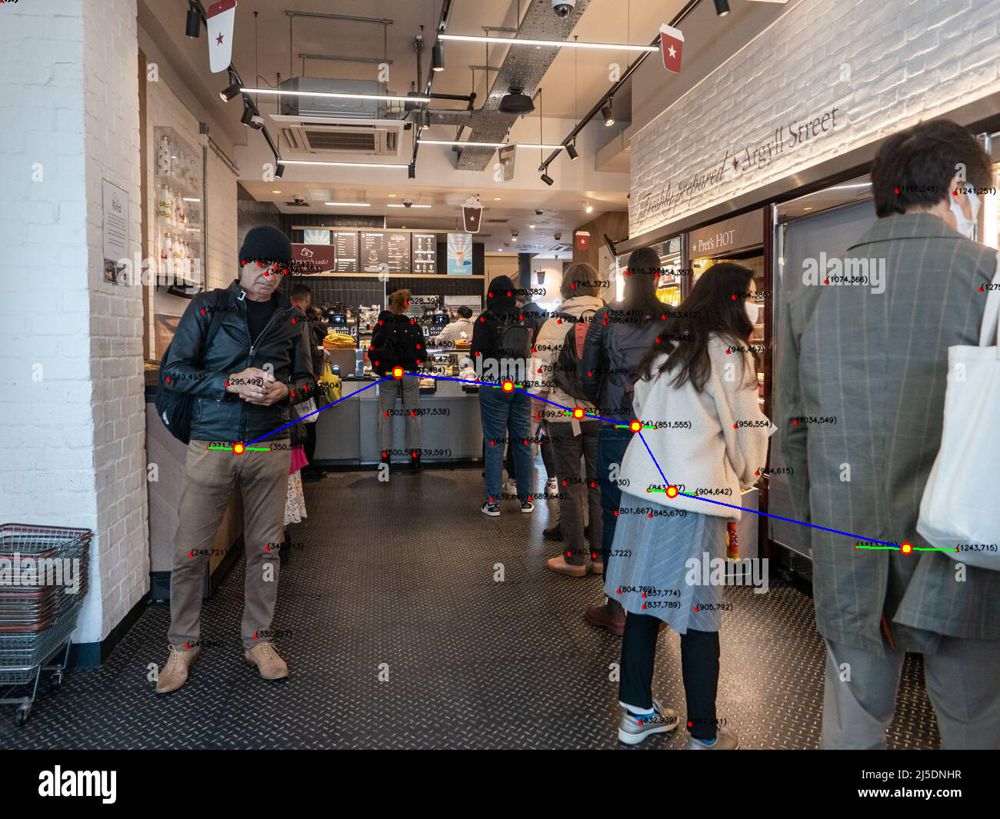

[[3263.642868925068, -2207.810202362281], [-3263.642868925068, 2207.810202362281], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0]]
[[3263.642868925068, -2207.810202362281], [-3259.6816435823916, 2207.9031062271465], [3259.6816435823916, -2207.9031062271465], [0, 0], [0, 0], [0, 0], [0, 0]]
[[3263.642868925068, -2207.810202362281], [-3259.6816435823916, 2207.9031062271465], [3480.815650823396, -2159.644825851589], [-3480.815650823396, 2159.644825851589], [0, 0], [0, 0], [0, 0]]
[[3263.642868925068, -2207.810202362281], [-3259.6816435823916, 2207.9031062271465], [3480.815650823396, -2159.644825851589], [-3458.2992157647204, 2161.385357600503], [3458.2992157647204, -2161.385357600503], [0, 0], [0, 0]]
[[3263.642868925068, -2207.810202362281], [-3259.6816435823916, 2207.9031062271465], [3480.815650823396, -2159.644825851589], [-3458.2992157647204, 2161.385357600503], [5772.8542670837915, 859.5987168268689], [-5772.8542670837915, -859.5987168268689], [0, 0]]
[[3263.642868925068, -2207.810202362281]

<ipython-input-27-26c4409f7424>:135: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = cm.get_cmap('jet')


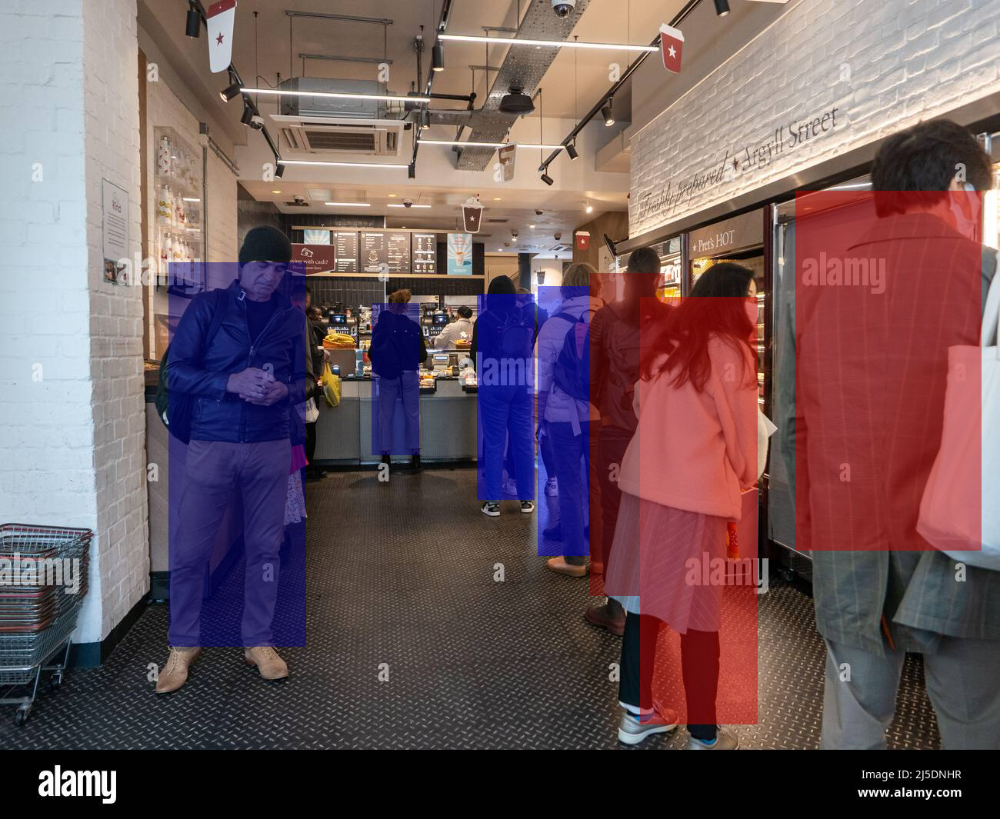

In [27]:
import cv2
from ultralytics import YOLO
import numpy as np
import pandas as pd
import math
import matplotlib.pyplot as plt
import matplotlib.cm as cm

def significant_pose_detection(arr, th):
    n = len(arr)
    i = 0
    for itemm in arr:
        if np.sum(itemm[0] + itemm[1]) != 0:
            i += 1

    sig_det = (i / n)
    if sig_det >= th:
        return 1

    return 0

# Load a model
model = YOLO('yolov8n-pose.pt')

image_file_name = "Q3_pose6.jpg"
img = cv2.imread(image_file_name)
results = model.predict(image_file_name)[0]
th = 0.3

Q = []
det = 0
concat_df = pd.DataFrame()

for result in results:
    landmarks = []
    kpts = result.keypoints
    nk = kpts.shape[1]

    for i in range(nk):
        keypoint = kpts.xy[0, i]
        x, y = int(keypoint[0].item()), int(keypoint[1].item())
        landmarks.append([x, y])

    detections = significant_pose_detection(landmarks, th)
    if detections == 1:
        det += 1
        for j in range(len(landmarks)):
            x = landmarks[j][0]
            y = landmarks[j][1]
            cv2.circle(img, (x, y), 3, (0, 0, 255), -1)
            ttext = "(" + str(x) + "," + str(y) + ")"
            cv2.putText(img, ttext, (x, y), cv2.FONT_HERSHEY_SIMPLEX, 0.3, (0, 0, 0), 1, cv2.LINE_AA)

        df = pd.DataFrame(landmarks, columns=['x' + str(det), 'y' + str(det)], dtype=float)
        concat_df = pd.concat([concat_df, df], axis=1)

        cv2.line(img, landmarks[11], landmarks[12], (0, 255, 0), 2)
        a = (landmarks[11][0] + landmarks[12][0]) // 2
        b = (landmarks[11][1] + landmarks[12][1]) // 2
        Q.append([a, b])

m = list(map(lambda l: [v for v in l if v != 0], sorted(Q)))
nQ = [ele for ele in m if ele != []]

dict = {}
sorted_Q = sorted(Q)
for i, point in enumerate(Q):
    j = sorted_Q.index(point)
    dict[j] = i

k = len(nQ)

i = 0
while i < (k - 1):
    cv2.line(img, nQ[i], nQ[i + 1], (255, 0, 0), 2)
    i += 1

i = 0
while i < k:
    cv2.circle(img, nQ[i], 5, (0, 255, 255), -1)
    cv2.circle(img, nQ[i], 7, (0, 0, 255), 2)
    i += 1

concat_df.to_csv('detected_pose.csv')
df_nQ = pd.DataFrame(nQ, columns=['x', 'y'], dtype=int)
df_nQ.to_csv('nQ_centroids.csv')

print("\n", k, "Persons detected.")
cv2.imwrite("output.jpg", img)
cv2_imshow(img)

numPeople = len(nQ)
ev = [(nQ[-1][0] - nQ[0][0]), (nQ[-1][1] - nQ[0][1])]
forces = [[0, 0] for _ in range(numPeople)]
k = 100

def findMag(v):
    return math.sqrt(v[0]**2 + v[1]**2)

def findAngle(p1, p2, ev):
    v12 = [(p1[0] - p2[0]), (p1[1] - p2[1])]
    value = (v12[0] * ev[0] + v12[1] * ev[1]) / (findMag(v12) * findMag(ev))
    return math.acos(value)

def findDis(p1, p2):
    return math.sqrt((p1[0] - p2[0])**2 + (p1[1] - p2[1])**2)

for i in range(numPeople - 1):
    theta = findAngle(nQ[i + 1], nQ[i], ev)
    dis = findDis(nQ[i + 1], nQ[i])
    deltaDis = dis * (1 - math.cos(theta))
    forces[i][0] += (k * deltaDis * math.cos(theta))
    if nQ[i + 1][1] > nQ[i][1]:
        forces[i][1] += (k * deltaDis * math.sin(theta))
    else:
        forces[i][1] += (-k * deltaDis * math.sin(theta))
    forces[i + 1][0] += (-1 * forces[i][0])
    forces[i + 1][1] += (-1 * forces[i][1])
    print(forces)

equivalent = [math.sqrt(force[0]**2 + force[1]**2) for force in forces]
print(equivalent)

def mark_outliers(nQ, tnet):
    img = cv2.imread('Q3_pose6.jpg')
    overlay = img.copy()
    output = img.copy()

    nQ = np.array(nQ, dtype=int)

    max_force = max(tnet)
    min_force = min(tnet)
    norm_tnet = [(value - min_force) / (max_force - min_force) for value in tnet]

    colormap = cm.get_cmap('jet')
    colors = colormap(norm_tnet)

    alpha = 0.5  # Transparency factor

    for i in range(len(nQ)):
        person_no = dict[i] + 1
        x = concat_df['x' + str(person_no)]
        y = concat_df['y' + str(person_no)]

        x_non_zero = [value for value in x if value != 0]
        y_non_zero = [value for value in y if value != 0]

        min_x = int(min(x_non_zero)) if x_non_zero else 0
        min_y = int(min(y_non_zero)) if y_non_zero else 0
        max_x = int(max(x_non_zero)) if x_non_zero else 0
        max_y = int(max(y_non_zero)) if y_non_zero else 0

        start_point = (min_x, min_y)
        end_point = (max_x, max_y)
        color = (colors[i][2] * 255, colors[i][1] * 255, colors[i][0] * 255)
        color = tuple(map(int, color))

        cv2.rectangle(overlay, start_point, end_point, color, -1)

    # Blend the overlay with the original image
    cv2.addWeighted(overlay, alpha, output, 1 - alpha, 0, output)

    cv2.imwrite('output_outlier.png', output)
    cv2_imshow(output)

mark_outliers(nQ, equivalent)



image 1/1 /content/Q3_pose8.jpg: 480x640 10 persons, 327.5ms
Speed: 5.3ms preprocess, 327.5ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)

 10 Persons detected.


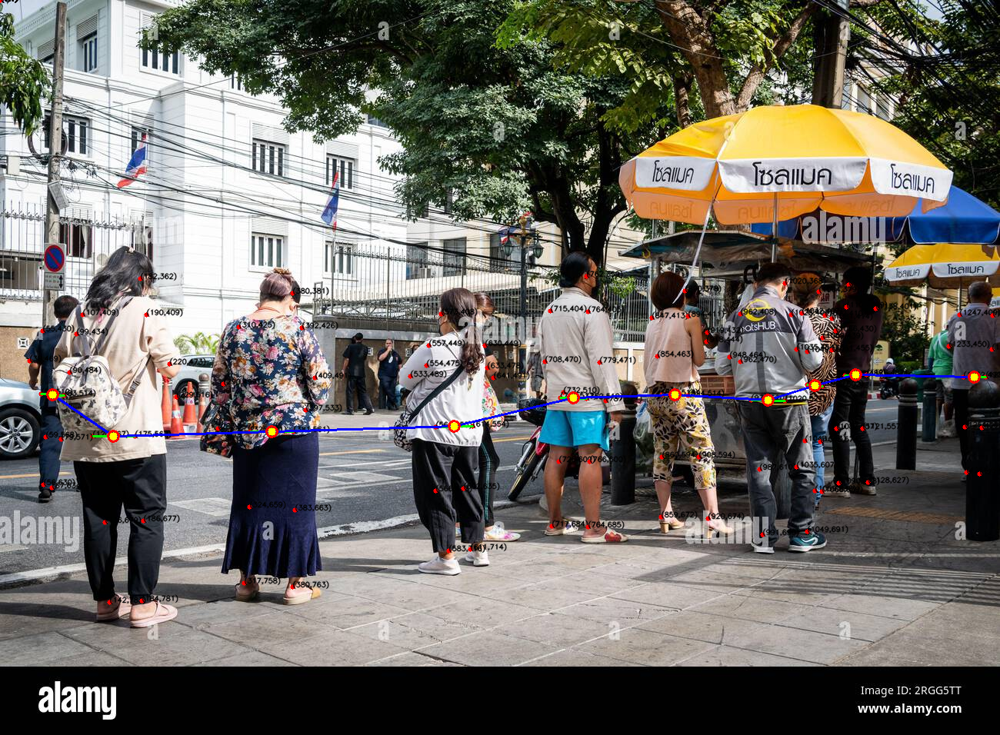

[[1445.3332563612803, 1029.204170742317], [-1445.3332563612803, -1029.204170742317], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0]]
[[1445.3332563612803, 1029.204170742317], [-1444.3189563134017, -1029.2142346283288], [1444.3189563134017, 1029.2142346283288], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0]]
[[1445.3332563612803, 1029.204170742317], [-1444.3189563134017, -1029.2142346283288], [1445.5841681577654, 1029.2011632918607], [-1445.5841681577654, -1029.2011632918607], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0]]
[[1445.3332563612803, 1029.204170742317], [-1444.3189563134017, -1029.2142346283288], [1445.5841681577654, 1029.2011632918607], [-1086.7226820028384, -1107.6158444459286], [1086.7226820028384, 1107.6158444459286], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0]]
[[1445.3332563612803, 1029.204170742317], [-1444.3189563134017, -1029.2142346283288], [1445.5841681577654, 1029.2011632918607], [-1086.7226820028384, -1107.6158444459286], [1087.5358096594612, 

<ipython-input-28-e30f1b633d8f>:135: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = cm.get_cmap('jet')


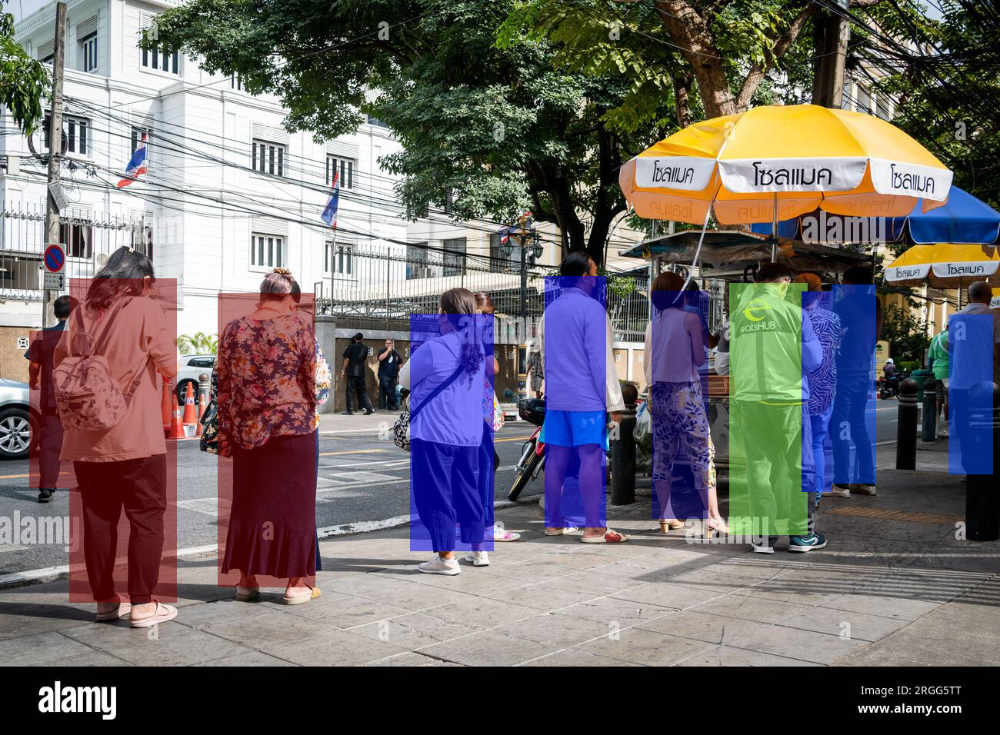

In [28]:
import cv2
from ultralytics import YOLO
import numpy as np
import pandas as pd
import math
import matplotlib.pyplot as plt
import matplotlib.cm as cm

def significant_pose_detection(arr, th):
    n = len(arr)
    i = 0
    for itemm in arr:
        if np.sum(itemm[0] + itemm[1]) != 0:
            i += 1

    sig_det = (i / n)
    if sig_det >= th:
        return 1

    return 0

# Load a model
model = YOLO('yolov8n-pose.pt')

image_file_name = "Q3_pose8.jpg"
img = cv2.imread(image_file_name)
results = model.predict(image_file_name)[0]
th = 0.3

Q = []
det = 0
concat_df = pd.DataFrame()

for result in results:
    landmarks = []
    kpts = result.keypoints
    nk = kpts.shape[1]

    for i in range(nk):
        keypoint = kpts.xy[0, i]
        x, y = int(keypoint[0].item()), int(keypoint[1].item())
        landmarks.append([x, y])

    detections = significant_pose_detection(landmarks, th)
    if detections == 1:
        det += 1
        for j in range(len(landmarks)):
            x = landmarks[j][0]
            y = landmarks[j][1]
            cv2.circle(img, (x, y), 3, (0, 0, 255), -1)
            ttext = "(" + str(x) + "," + str(y) + ")"
            cv2.putText(img, ttext, (x, y), cv2.FONT_HERSHEY_SIMPLEX, 0.3, (0, 0, 0), 1, cv2.LINE_AA)

        df = pd.DataFrame(landmarks, columns=['x' + str(det), 'y' + str(det)], dtype=float)
        concat_df = pd.concat([concat_df, df], axis=1)

        cv2.line(img, landmarks[11], landmarks[12], (0, 255, 0), 2)
        a = (landmarks[11][0] + landmarks[12][0]) // 2
        b = (landmarks[11][1] + landmarks[12][1]) // 2
        Q.append([a, b])

m = list(map(lambda l: [v for v in l if v != 0], sorted(Q)))
nQ = [ele for ele in m if ele != []]

dict = {}
sorted_Q = sorted(Q)
for i, point in enumerate(Q):
    j = sorted_Q.index(point)
    dict[j] = i

k = len(nQ)

i = 0
while i < (k - 1):
    cv2.line(img, nQ[i], nQ[i + 1], (255, 0, 0), 2)
    i += 1

i = 0
while i < k:
    cv2.circle(img, nQ[i], 5, (0, 255, 255), -1)
    cv2.circle(img, nQ[i], 7, (0, 0, 255), 2)
    i += 1

concat_df.to_csv('detected_pose.csv')
df_nQ = pd.DataFrame(nQ, columns=['x', 'y'], dtype=int)
df_nQ.to_csv('nQ_centroids.csv')

print("\n", k, "Persons detected.")
cv2.imwrite("output.jpg", img)
cv2_imshow(img)

numPeople = len(nQ)
ev = [(nQ[-1][0] - nQ[0][0]), (nQ[-1][1] - nQ[0][1])]
forces = [[0, 0] for _ in range(numPeople)]
k = 100

def findMag(v):
    return math.sqrt(v[0]**2 + v[1]**2)

def findAngle(p1, p2, ev):
    v12 = [(p1[0] - p2[0]), (p1[1] - p2[1])]
    value = (v12[0] * ev[0] + v12[1] * ev[1]) / (findMag(v12) * findMag(ev))
    return math.acos(value)

def findDis(p1, p2):
    return math.sqrt((p1[0] - p2[0])**2 + (p1[1] - p2[1])**2)

for i in range(numPeople - 1):
    theta = findAngle(nQ[i + 1], nQ[i], ev)
    dis = findDis(nQ[i + 1], nQ[i])
    deltaDis = dis * (1 - math.cos(theta))
    forces[i][0] += (k * deltaDis * math.cos(theta))
    if nQ[i + 1][1] > nQ[i][1]:
        forces[i][1] += (k * deltaDis * math.sin(theta))
    else:
        forces[i][1] += (-k * deltaDis * math.sin(theta))
    forces[i + 1][0] += (-1 * forces[i][0])
    forces[i + 1][1] += (-1 * forces[i][1])
    print(forces)

equivalent = [math.sqrt(force[0]**2 + force[1]**2) for force in forces]
print(equivalent)

def mark_outliers(nQ, tnet):
    img = cv2.imread('Q3_pose8.jpg')
    overlay = img.copy()
    output = img.copy()

    nQ = np.array(nQ, dtype=int)

    max_force = max(tnet)
    min_force = min(tnet)
    norm_tnet = [(value - min_force) / (max_force - min_force) for value in tnet]

    colormap = cm.get_cmap('jet')
    colors = colormap(norm_tnet)

    alpha = 0.5  # Transparency factor

    for i in range(len(nQ)):
        person_no = dict[i] + 1
        x = concat_df['x' + str(person_no)]
        y = concat_df['y' + str(person_no)]

        x_non_zero = [value for value in x if value != 0]
        y_non_zero = [value for value in y if value != 0]

        min_x = int(min(x_non_zero)) if x_non_zero else 0
        min_y = int(min(y_non_zero)) if y_non_zero else 0
        max_x = int(max(x_non_zero)) if x_non_zero else 0
        max_y = int(max(y_non_zero)) if y_non_zero else 0

        start_point = (min_x, min_y)
        end_point = (max_x, max_y)
        color = (colors[i][2] * 255, colors[i][1] * 255, colors[i][0] * 255)
        color = tuple(map(int, color))

        cv2.rectangle(overlay, start_point, end_point, color, -1)

    # Blend the overlay with the original image
    cv2.addWeighted(overlay, alpha, output, 1 - alpha, 0, output)

    cv2.imwrite('output_outlier.png', output)
    cv2_imshow(output)

mark_outliers(nQ, equivalent)
